# UDACITY CAPSTONE PROJECT- DOG BREED CLASSIFICATION

### LOADING DATASETS

In [4]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob

def load_dataset(path):
    data = load_files(path)
    #print(data['filenames'])
    dog_images = np.array(data['filenames'])
    dog_labels = np_utils.to_categorical(np.array(data['target']), 133)
    return dog_images, dog_labels

train_images, train_labels = load_dataset('dogImages/train')
valid_images, valid_labels = load_dataset('dogImages/valid')
test_images, test_labels = load_dataset('dogImages/test')



### ANALYZING THE DATA

In [2]:
print('There are %s total dog images.\n' % len(np.hstack([train_images, valid_images, test_images])))
print('There are %d training dog images.' % len(train_images))
print('There are %d validation dog images.' % len(valid_images))
print('There are %d test dog images.'% len(test_images))

There are 8351 total dog images.

There are 6680 training dog images.
There are 835 validation dog images.
There are 836 test dog images.


6680
332 500 3


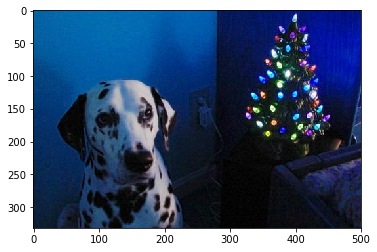

In [3]:
print(len(train_labels))

import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline      
 

img = cv2.imread(train_images[1])

height,width,channels=img.shape
print(height,width,channels)
plt.imshow(img)
plt.show()

In [4]:
height_list = []
width_list = []
for i in train_images:
    img=cv2.imread(i)
    height,width,channels=img.shape
    height_list.append(height)
    width_list.append(width)
    

Average height : 532.157485
Average width : 571.382335


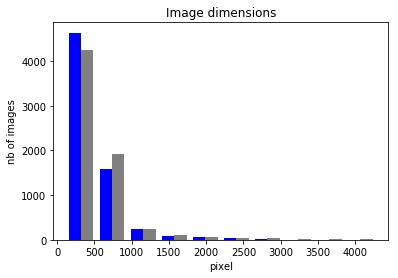

In [5]:
plt.hist([height_list, width_list], color=['blue','grey'], label=['height', 'width'])

plt.ylabel('nb of images')
plt.xlabel('pixel')
plt.title('Image dimensions')

print("Average height : %f" % np.mean(height_list))
print("Average width : %f" % np.mean(width_list))

In [7]:
dog_names = [item[20:-1] for item in sorted(glob("dogImages/train/*/"))]
print("The breeds are")
print()
print(dog_names)
print(len(dog_names))

The breeds are

['Affenpinscher', 'Afghan_hound', 'Airedale_terrier', 'Akita', 'Alaskan_malamute', 'American_eskimo_dog', 'American_foxhound', 'American_staffordshire_terrier', 'American_water_spaniel', 'Anatolian_shepherd_dog', 'Australian_cattle_dog', 'Australian_shepherd', 'Australian_terrier', 'Basenji', 'Basset_hound', 'Beagle', 'Bearded_collie', 'Beauceron', 'Bedlington_terrier', 'Belgian_malinois', 'Belgian_sheepdog', 'Belgian_tervuren', 'Bernese_mountain_dog', 'Bichon_frise', 'Black_and_tan_coonhound', 'Black_russian_terrier', 'Bloodhound', 'Bluetick_coonhound', 'Border_collie', 'Border_terrier', 'Borzoi', 'Boston_terrier', 'Bouvier_des_flandres', 'Boxer', 'Boykin_spaniel', 'Briard', 'Brittany', 'Brussels_griffon', 'Bull_terrier', 'Bulldog', 'Bullmastiff', 'Cairn_terrier', 'Canaan_dog', 'Cane_corso', 'Cardigan_welsh_corgi', 'Cavalier_king_charles_spaniel', 'Chesapeake_bay_retriever', 'Chihuahua', 'Chinese_crested', 'Chinese_shar-pei', 'Chow_chow', 'Clumber_spaniel', 'Cocker_spa

In [7]:
import seaborn as sns
count = []
number = 0;
for item in sorted(glob("dogImages/train/*/")):
    
    for i in glob(item+'*'):
        number=number+1
    count.append(number)
    number = 0
print(count)
        

 

 

[64, 58, 52, 63, 77, 64, 50, 66, 34, 50, 66, 66, 46, 69, 73, 59, 62, 50, 48, 62, 64, 47, 65, 62, 37, 41, 64, 35, 74, 52, 56, 65, 45, 64, 53, 65, 50, 57, 69, 53, 69, 63, 50, 64, 53, 67, 54, 54, 50, 50, 62, 49, 47, 57, 50, 65, 71, 50, 47, 60, 61, 53, 53, 39, 42, 33, 34, 63, 51, 47, 62, 48, 42, 41, 44, 64, 43, 40, 59, 46, 56, 61, 46, 50, 37, 53, 66, 51, 53, 58, 57, 44, 35, 44, 49, 43, 50, 46, 42, 34, 48, 29, 58, 42, 31, 50, 46, 26, 45, 33, 44, 54, 39, 35, 63, 30, 48, 53, 31, 39, 28, 32, 44, 50, 34, 30, 41, 30, 48, 44, 30, 26, 30]


Text(0,0.5,'count')

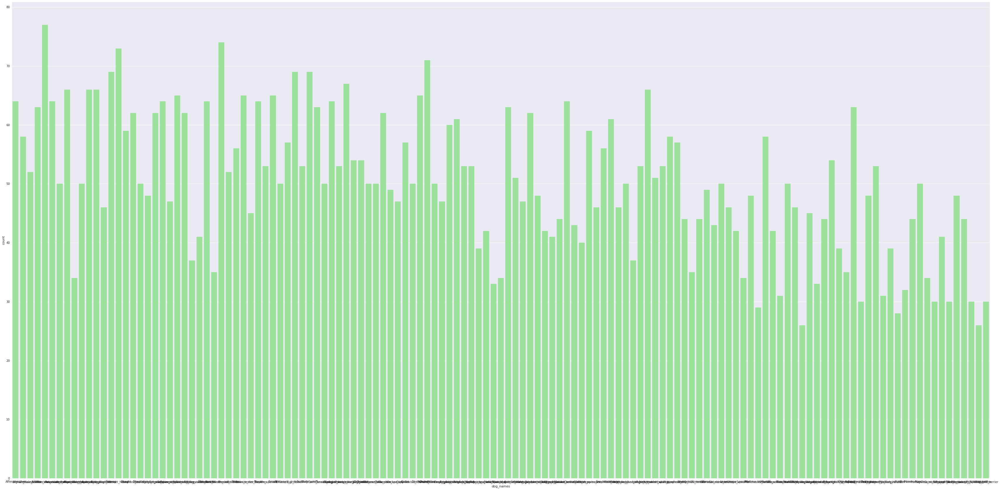

In [8]:
sns.set(color_codes=True)
plt.rcParams['figure.figsize'] = (60.0, 30.0)
sns.barplot(dog_names, count, color="lightgreen")
plt.xlabel("dog_names")
plt.ylabel("count")

In [9]:
count = 0

for item in sorted(glob("dogImages/train/*/")):
    
    for i in glob(item+'*'):
        img = img=cv2.imread(i)
        plt.rcParams['figure.figsize'] = (20.0, 30.0)
        #plt.imshow(img)
        #plt.show()
        count=count+1
        if count == 1:
            break
    count = 0
            


### PRE-PROCESSING THE DATA

In [2]:
from keras.preprocessing import image                  


def tensor_4d(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    return np.expand_dims(x, axis=0)


### USING PRE-TRAINED MODELS FOR PREDICTION

##### 1) VGG 16 

In [1]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions
import pickle


pickle_in = open("data.pkl","rb")
dog_breed = pickle.load(pickle_in)
model = VGG16(weights='imagenet')

def prediction_labels(img_path):
    img = preprocess_input(tensor_4d(img_path))
    output = model.predict(img)
    #print(output
    return dog_breed[np.argmax(output)]
    

Using TensorFlow backend.


In [10]:
training_set = train_images[:200]
import numpy as np
num_dog_faces = 0
i = 0
answer = []
k = 0
for face in training_set:
    answer = prediction_labels(face)
    
    
    for j in train_labels[i]:
        k = k+1
        if j == 1:
            break;
    print(i)
    print(answer)
    print(dog_names[k-1])
    k=0
    i= i+1
   

0
kuvasz
Kuvasz
1
dalmatian, coach dog, carriage dog
Dalmatian
2
Irish water spaniel
Irish_water_spaniel
3
Staffordshire bullterrier, Staffordshire bull terrier
American_staffordshire_terrier
4
American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier
American_staffordshire_terrier
5
Welsh springer spaniel
English_springer_spaniel
6
collie
Collie
7
wire-haired fox terrier
Petit_basset_griffon_vendeen
8
Irish water spaniel
American_water_spaniel
9
Italian greyhound
Greyhound
10
Border collie
Australian_shepherd
11
German shepherd, German shepherd dog, German police dog, alsatian
German_shepherd_dog
12
beagle
Basset_hound
13
cocker spaniel, English cocker spaniel, cocker
Cocker_spaniel
14
Lhasa, Lhasa apso
Lhasa_apso
15
Sussex spaniel
American_water_spaniel
16
flat-coated retriever
Dachshund
17
Maltese dog, Maltese terrier, Maltese
Havanese
18
Pekinese, Pekingese, Peke
Pekingese
19
chow, chow chow
Chow_chow
20
Lakeland terrier
Lakeland_terrier
21


188
flat-coated retriever
Flat-coated_retriever
189
Dandie Dinmont, Dandie Dinmont terrier
Dandie_dinmont_terrier
190
bull mastiff
Neapolitan_mastiff
191
bull mastiff
Bulldog
192
basset, basset hound
Basset_hound
193
Great Pyrenees
Great_pyrenees
194
flat-coated retriever
Flat-coated_retriever
195
Chesapeake Bay retriever
Chinese_shar-pei
196
Brittany spaniel
Brittany
197
Ibizan hound, Ibizan Podenco
Pharaoh_hound
198
malinois
Belgian_malinois
199
Irish terrier
Irish_terrier


In [12]:
training_set = test_images[:200]
import numpy as np
i = 0
answer = []
k = 0
for face in training_set:
    answer = prediction_labels(face)

    
    for j in test_labels[i]:
        k = k+1
        if j == 1:
            break;
    print(i)
    print(answer)
    print(dog_names[k-1])
    k=0
    i= i+1

0
dalmatian, coach dog, carriage dog
Dalmatian
1
Doberman, Doberman pinscher
Doberman_pinscher
2
papillon
Papillon
3
Bedlington terrier
Bedlington_terrier
4
flat-coated retriever
Flat-coated_retriever
5
Scotch terrier, Scottish terrier, Scottie
Belgian_sheepdog
6
Ibizan hound, Ibizan Podenco
Canaan_dog
7
clumber, clumber spaniel
Clumber_spaniel
8
Kerry blue terrier
Lakeland_terrier
9
chow, chow chow
Chow_chow
10
Afghan hound, Afghan
Afghan_hound
11
Bedlington terrier
Bedlington_terrier
12
West Highland white terrier
Glen_of_imaal_terrier
13
Yorkshire terrier
Yorkshire_terrier
14
German shepherd, German shepherd dog, German police dog, alsatian
German_shepherd_dog
15
Staffordshire bullterrier, Staffordshire bull terrier
Basenji
16
Pomeranian
Pomeranian
17
Boston bull, Boston terrier
Boston_terrier
18
Japanese spaniel
Japanese_chin
19
Norwich terrier
Cairn_terrier
20
Leonberg
Leonberger
21
French bulldog
French_bulldog
22
otterhound, otter hound
Dachshund
23
kuvasz
Kuvasz
24
briard
Briar

193
standard poodle
Poodle
194
borzoi, Russian wolfhound
Borzoi
195
cocker spaniel, English cocker spaniel, cocker
Cavalier_king_charles_spaniel
196
cocker spaniel, English cocker spaniel, cocker
English_cocker_spaniel
197
kelpie
Australian_cattle_dog
198
Irish water spaniel
American_water_spaniel
199
Leonberg
Leonberger


##### 2) RESNET 50

In [16]:
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input, decode_predictions

model = ResNet50(weights='imagenet')

def prediction_labels(img_path):
    img = preprocess_input(tensor_4d(img_path))
    output = model.predict(img)
    #print(output
    return dog_breed[np.argmax(output)]

In [13]:
training_set = train_images[:200]
import numpy as np
i = 0
answer = []
k = 0
for face in training_set:
    answer = prediction_labels(face)
    
    
    for j in train_labels[i]:
        k = k+1
        if j == 1:
            break;
    print(i)
    print(answer)
    print(dog_names[k-1])
    k=0
    i= i+1
   

0
kuvasz
Kuvasz
1
dalmatian, coach dog, carriage dog
Dalmatian
2
Irish water spaniel
Irish_water_spaniel
3
Staffordshire bullterrier, Staffordshire bull terrier
American_staffordshire_terrier
4
American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier
American_staffordshire_terrier
5
Welsh springer spaniel
English_springer_spaniel
6
collie
Collie
7
wire-haired fox terrier
Petit_basset_griffon_vendeen
8
Irish water spaniel
American_water_spaniel
9
Italian greyhound
Greyhound
10
Border collie
Australian_shepherd
11
German shepherd, German shepherd dog, German police dog, alsatian
German_shepherd_dog
12
beagle
Basset_hound
13
cocker spaniel, English cocker spaniel, cocker
Cocker_spaniel
14
Lhasa, Lhasa apso
Lhasa_apso
15
Sussex spaniel
American_water_spaniel
16
flat-coated retriever
Dachshund
17
Maltese dog, Maltese terrier, Maltese
Havanese
18
Pekinese, Pekingese, Peke
Pekingese
19
chow, chow chow
Chow_chow
20
Lakeland terrier
Lakeland_terrier
21


188
flat-coated retriever
Flat-coated_retriever
189
Dandie Dinmont, Dandie Dinmont terrier
Dandie_dinmont_terrier
190
bull mastiff
Neapolitan_mastiff
191
bull mastiff
Bulldog
192
basset, basset hound
Basset_hound
193
Great Pyrenees
Great_pyrenees
194
flat-coated retriever
Flat-coated_retriever
195
Chesapeake Bay retriever
Chinese_shar-pei
196
Brittany spaniel
Brittany
197
Ibizan hound, Ibizan Podenco
Pharaoh_hound
198
malinois
Belgian_malinois
199
Irish terrier
Irish_terrier


In [14]:
training_set = test_images[:200]
import numpy as np
i = 0
answer = []
k = 0
for face in training_set:
    answer = prediction_labels(face)
    
    
    for j in test_labels[i]:
        k = k+1
        if j == 1:
            break;
    print(i)
    print(answer)
    print(dog_names[k-1])
    k=0
    i= i+1

0
dalmatian, coach dog, carriage dog
Dalmatian
1
Doberman, Doberman pinscher
Doberman_pinscher
2
papillon
Papillon
3
Bedlington terrier
Bedlington_terrier
4
flat-coated retriever
Flat-coated_retriever
5
Scotch terrier, Scottish terrier, Scottie
Belgian_sheepdog
6
Ibizan hound, Ibizan Podenco
Canaan_dog
7
clumber, clumber spaniel
Clumber_spaniel
8
Kerry blue terrier
Lakeland_terrier
9
chow, chow chow
Chow_chow
10
Afghan hound, Afghan
Afghan_hound
11
Bedlington terrier
Bedlington_terrier
12
West Highland white terrier
Glen_of_imaal_terrier
13
Yorkshire terrier
Yorkshire_terrier
14
German shepherd, German shepherd dog, German police dog, alsatian
German_shepherd_dog
15
Staffordshire bullterrier, Staffordshire bull terrier
Basenji
16
Pomeranian
Pomeranian
17
Boston bull, Boston terrier
Boston_terrier
18
Japanese spaniel
Japanese_chin
19
Norwich terrier
Cairn_terrier
20
Leonberg
Leonberger
21
French bulldog
French_bulldog
22
otterhound, otter hound
Dachshund
23
kuvasz
Kuvasz
24
briard
Briar

193
standard poodle
Poodle
194
borzoi, Russian wolfhound
Borzoi
195
cocker spaniel, English cocker spaniel, cocker
Cavalier_king_charles_spaniel
196
cocker spaniel, English cocker spaniel, cocker
English_cocker_spaniel
197
kelpie
Australian_cattle_dog
198
Irish water spaniel
American_water_spaniel
199
Leonberg
Leonberger


#####  3) INCEPTION

In [18]:
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input, decode_predictions

model = InceptionV3(weights='imagenet')

def prediction_labels(img_path):
    img = preprocess_input(tensor_4d(img_path))
    output = model.predict(img)
    #print(output
    return dog_breed[np.argmax(output)]

In [15]:
training_set = train_images[:200]
import numpy as np
i = 0
answer = []
k = 0
for face in training_set:
    answer = prediction_labels(face)
    
    
    for j in train_labels[i]:
        k = k+1
        if j == 1:
            break;
    print(i)
    print(answer)
    print(dog_names[k-1])
    k=0
    i= i+1
   

0
kuvasz
Kuvasz
1
dalmatian, coach dog, carriage dog
Dalmatian
2
Irish water spaniel
Irish_water_spaniel
3
Staffordshire bullterrier, Staffordshire bull terrier
American_staffordshire_terrier
4
American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier
American_staffordshire_terrier
5
Welsh springer spaniel
English_springer_spaniel
6
collie
Collie
7
wire-haired fox terrier
Petit_basset_griffon_vendeen
8
Irish water spaniel
American_water_spaniel
9
Italian greyhound
Greyhound
10
Border collie
Australian_shepherd
11
German shepherd, German shepherd dog, German police dog, alsatian
German_shepherd_dog
12
beagle
Basset_hound
13
cocker spaniel, English cocker spaniel, cocker
Cocker_spaniel
14
Lhasa, Lhasa apso
Lhasa_apso
15
Sussex spaniel
American_water_spaniel
16
flat-coated retriever
Dachshund
17
Maltese dog, Maltese terrier, Maltese
Havanese
18
Pekinese, Pekingese, Peke
Pekingese
19
chow, chow chow
Chow_chow
20
Lakeland terrier
Lakeland_terrier
21


188
flat-coated retriever
Flat-coated_retriever
189
Dandie Dinmont, Dandie Dinmont terrier
Dandie_dinmont_terrier
190
bull mastiff
Neapolitan_mastiff
191
bull mastiff
Bulldog
192
basset, basset hound
Basset_hound
193
Great Pyrenees
Great_pyrenees
194
flat-coated retriever
Flat-coated_retriever
195
Chesapeake Bay retriever
Chinese_shar-pei
196
Brittany spaniel
Brittany
197
Ibizan hound, Ibizan Podenco
Pharaoh_hound
198
malinois
Belgian_malinois
199
Irish terrier
Irish_terrier


In [17]:
training_set = test_images[:200]
import numpy as np
i = 0
number = 0
answer = []
k = 0
for face in training_set:
    answer = prediction_labels(face)
   
    
    for j in test_labels[i]:
        k = k+1
        if j == 1:
            break;
    print(i)
    print(answer)
    if dog_names[k-1] in answer:
        number = number +1
    print(dog_names[k-1])
    k=0
    i= i+1
print(number)

0
dalmatian, coach dog, carriage dog
Dalmatian
1
Doberman, Doberman pinscher
Doberman_pinscher
2
papillon
Papillon
3
Bedlington terrier
Bedlington_terrier
4
flat-coated retriever
Flat-coated_retriever
5
Scotch terrier, Scottish terrier, Scottie
Belgian_sheepdog
6
Ibizan hound, Ibizan Podenco
Canaan_dog
7
clumber, clumber spaniel
Clumber_spaniel
8
Kerry blue terrier
Lakeland_terrier
9
chow, chow chow
Chow_chow
10
Afghan hound, Afghan
Afghan_hound
11
Bedlington terrier
Bedlington_terrier
12
West Highland white terrier
Glen_of_imaal_terrier
13
Yorkshire terrier
Yorkshire_terrier
14
German shepherd, German shepherd dog, German police dog, alsatian
German_shepherd_dog
15
Staffordshire bullterrier, Staffordshire bull terrier
Basenji
16
Pomeranian
Pomeranian
17
Boston bull, Boston terrier
Boston_terrier
18
Japanese spaniel
Japanese_chin
19
Norwich terrier
Cairn_terrier
20
Leonberg
Leonberger
21
French bulldog
French_bulldog
22
otterhound, otter hound
Dachshund
23
kuvasz
Kuvasz
24
briard
Briar

193
standard poodle
Poodle
194
borzoi, Russian wolfhound
Borzoi
195
cocker spaniel, English cocker spaniel, cocker
Cavalier_king_charles_spaniel
196
cocker spaniel, English cocker spaniel, cocker
English_cocker_spaniel
197
kelpie
Australian_cattle_dog
198
Irish water spaniel
American_water_spaniel
199
Leonberg
Leonberger
10


### EXTRACTING BOTTLENECK FEATURES

##  1)  VGG16

In [20]:
bottleneck_features_vgg16 = np.load('bottleneck_features/DogVGG16Data.npz')
train_VGG16 = bottleneck_features_vgg16['train']
valid_VGG16 = bottleneck_features_vgg16['valid']
test_VGG16 = bottleneck_features_vgg16['test']

### USING AS FEATURE EXTRACTOR

The model uses the the pre-trained VGG-16 model as a feature extractor, where the last convolutional output of VGG-16 is fed as input to our model. 

In [21]:
from keras.callbacks import ModelCheckpoint  
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dropout(0.4))
VGG16_model.add(Dense(500, activation='relu'))
VGG16_model.add(Dropout(0.5))
VGG16_model.add(Dense(133, activation='softmax'))

VGG16_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 500)               256500    
_________________________________________________________________
dropout_2 (Dropout)          (None, 500)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 133)               66633     
Total params: 323,133
Trainable params: 323,133
Non-trainable params: 0
_________________________________________________________________


### COMPILING THE MODEL

In [22]:
VGG16_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### CHECKPOINT CREATION

In [23]:
Checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5', 
                               verbose=1, save_best_only=True)

VGG16_model.fit(train_VGG16, train_labels, 
          validation_data=(valid_VGG16, valid_labels),
          epochs=20, batch_size=20, callbacks=[Checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 6s 856us/step - loss: 14.5021 - acc: 0.0437 - val_loss: 10.1971 - val_acc: 0.1737

Epoch 00001: val_loss improved from inf to 10.19705, saving model to saved_models/weights.best.VGG16.hdf5
Epoch 2/20
6680/6680 [==============================] - 4s 556us/step - loss: 7.0391 - acc: 0.1031 - val_loss: 3.7627 - val_acc: 0.2707

Epoch 00002: val_loss improved from 10.19705 to 3.76265, saving model to saved_models/weights.best.VGG16.hdf5
Epoch 3/20
6680/6680 [==============================] - 4s 527us/step - loss: 3.9736 - acc: 0.1885 - val_loss: 2.6083 - val_acc: 0.4275

Epoch 00003: val_loss improved from 3.76265 to 2.60830, saving model to saved_models/weights.best.VGG16.hdf5
Epoch 4/20
6680/6680 [==============================] - 4s 525us/step - loss: 3.4292 - acc: 0.2558 - val_loss: 2.0636 - val_acc: 0.5102

Epoch 00004: val_loss improved from 2.60830 to 2.06359, saving model to saved_

####  LOG LOSS:
The value of log losscan be infered from above at last epoch i.e epoch 20 is 2.58854

### SAVING WEIGHTS

In [24]:
VGG16_model.load_weights('saved_models/weights.best.VGG16.hdf5')

### ACCURACY ON TEST SET

In [25]:
VGG16_predictions = [np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0))) for feature in test_VGG16]

# report test accuracy
test_accuracy = 100*np.sum(np.array(VGG16_predictions)==np.argmax(test_labels, axis=1))/len(VGG16_predictions)
print('Test accuracy: %.2f%%' % test_accuracy)

Test accuracy: 63.28%


### TESTING ON IMAGES NOT SEEN BY THE NETWORK

In [52]:
from extract_bottleneck_features import *

def VGG16_prediction(img_path):
    bottleneck_feature = extract_VGG16(tensor_4d(img_path))
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    return dog_names[np.argmax(predicted_vector)]

In [53]:
def detector(img_path):
    breed = VGG16_prediction(img_path) 
    
    image = cv2.imread(img_path)
    cv_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(cv_rgb)
    plt.show()
    return breed

In [54]:
test_images_files = np.array(glob("test_images/*"))
print(test_images_files)

['test_images/italian greyhound.jpeg' 'test_images/Lhasa Apso.jpg'
 'test_images/afghan hound.png' 'test_images/Basenji_.jpg'
 'test_images/german pinscher.jpeg' 'test_images/saint bernard.jpg']


actual label:
test_images/italian greyhound.jpeg
predicted label:


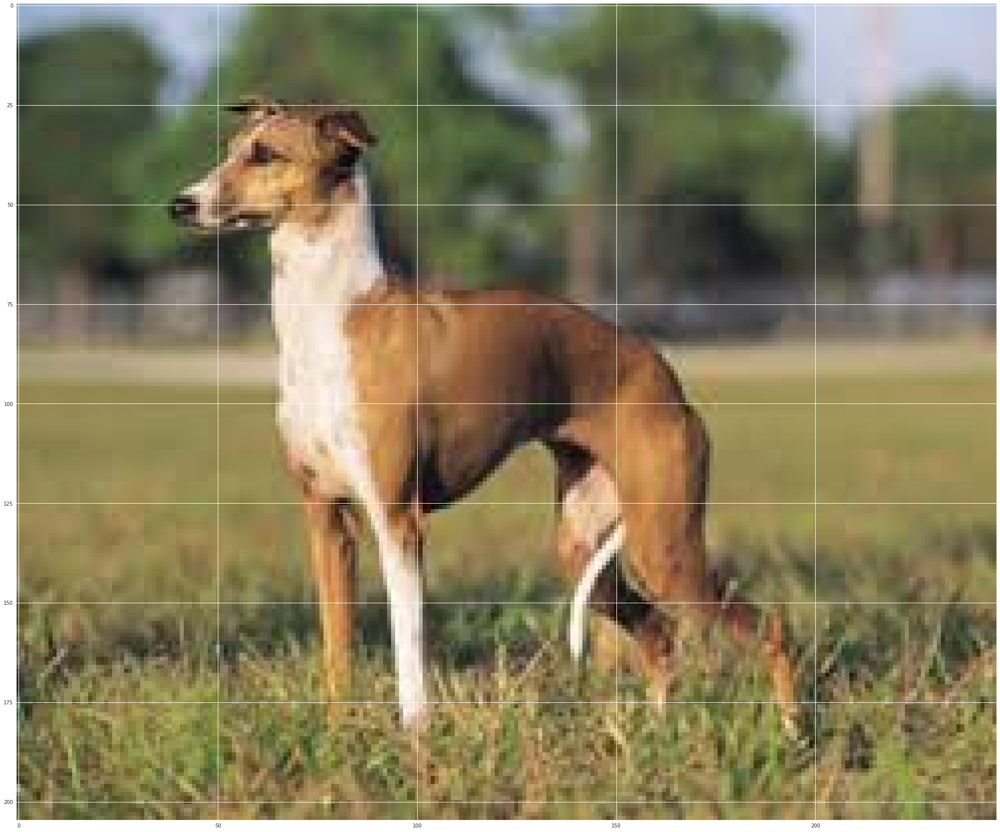

Parson_russell_terrier
actual label:
test_images/Lhasa Apso.jpg
predicted label:


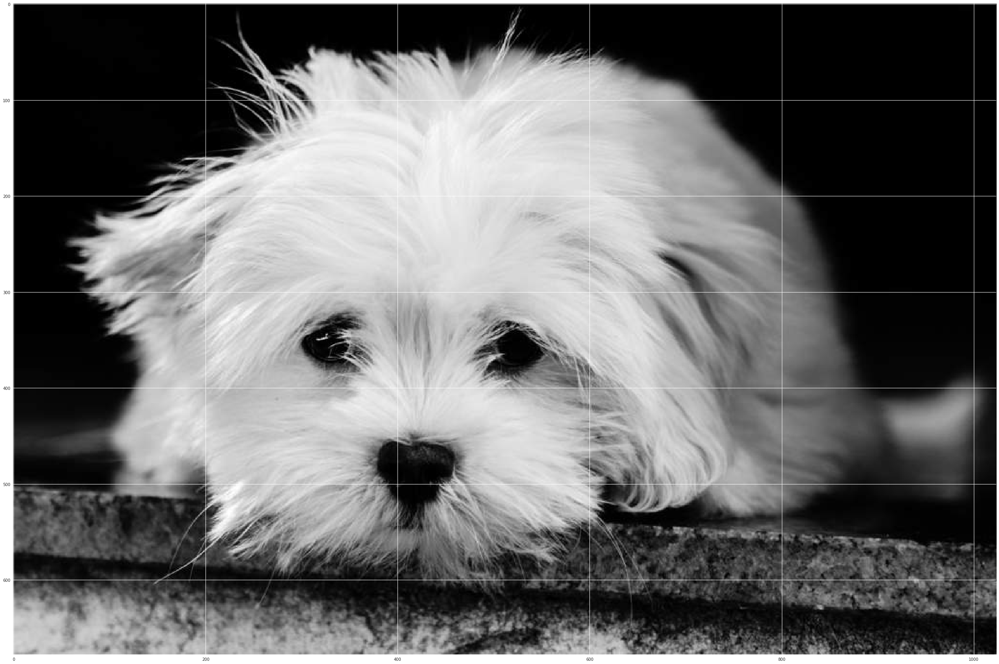

Dandie_dinmont_terrier
actual label:
test_images/afghan hound.png
predicted label:


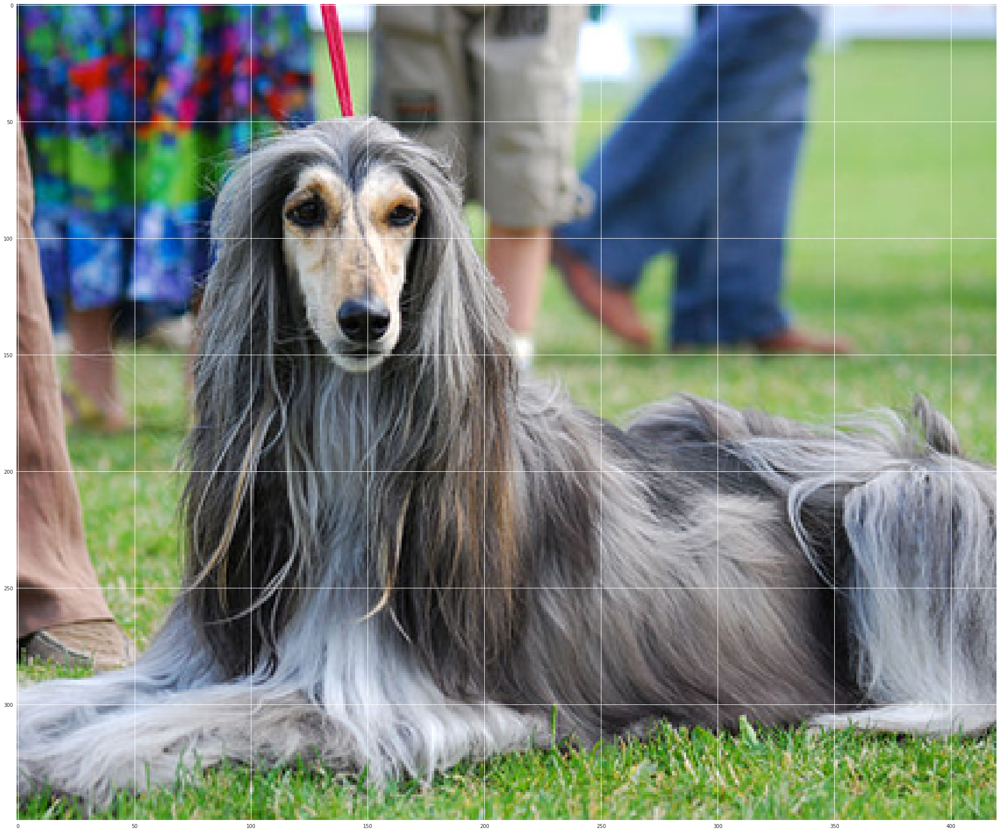

Afghan_hound
actual label:
test_images/Basenji_.jpg
predicted label:


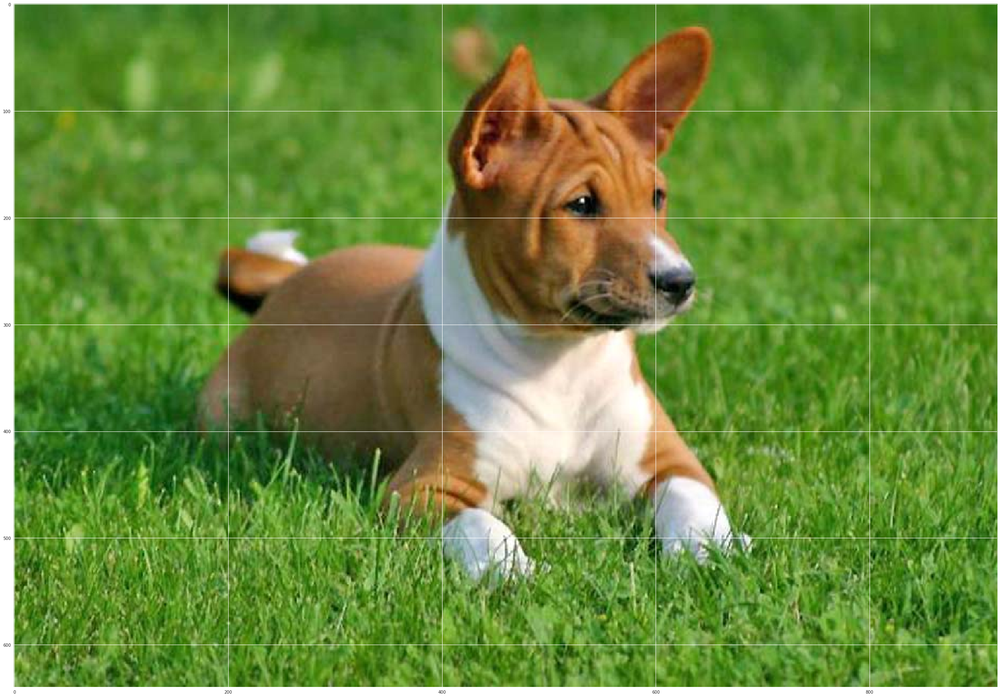

Basenji
actual label:
test_images/german pinscher.jpeg
predicted label:


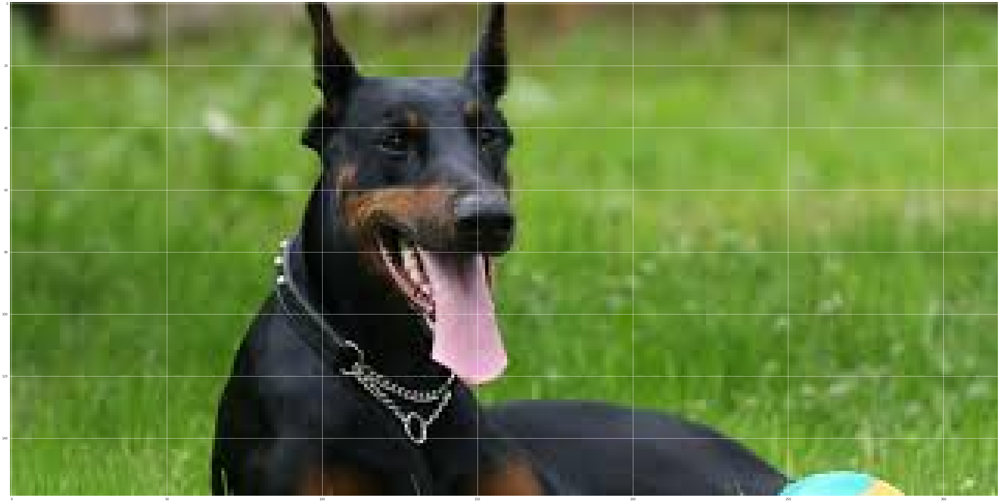

German_pinscher
actual label:
test_images/saint bernard.jpg
predicted label:


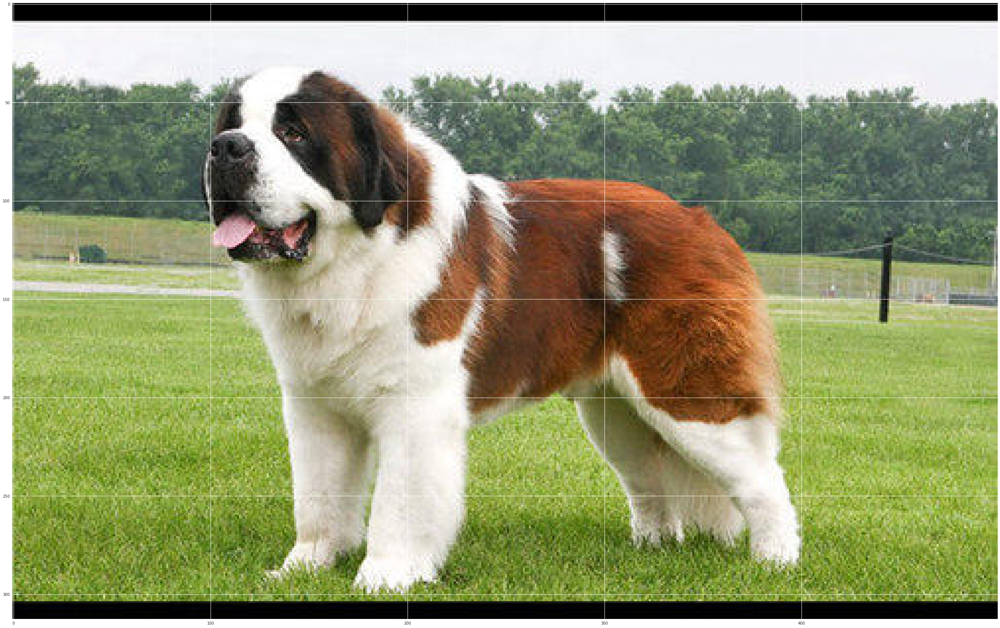

Saint_bernard


In [55]:
for path in test_images_files:
    print("actual label:")
    print(path)
    print("predicted label:")
    result = detector(path)
    print (result)

## 2) RESNET 50

In [26]:
bottleneck_features_resnet50 = np.load('bottleneck_features/DogResnet50Data.npz')
train_RESNET50 = bottleneck_features_resnet50['train']
valid_RESNET50 = bottleneck_features_resnet50['valid']
test_RESNET50 = bottleneck_features_resnet50['test']

### USING AS FEATURE EXTRACTOR

The model uses the the pre-trained RESNET-50 model as a feature extractor, where the last convolutional output of RESNET50 is fed as input to our model. 

In [27]:
RESNET50_model = Sequential()
RESNET50_model.add(GlobalAveragePooling2D(input_shape=train_RESNET50.shape[1:]))
RESNET50_model.add(Dropout(0.4))
RESNET50_model.add(Dense(500, activation='relu'))
RESNET50_model.add(Dropout(0.5))
RESNET50_model.add(Dense(133, activation='softmax'))

RESNET50_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 500)               1024500   
_________________________________________________________________
dropout_4 (Dropout)          (None, 500)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 133)               66633     
Total params: 1,091,133
Trainable params: 1,091,133
Non-trainable params: 0
_________________________________________________________________


### COMPILING THE MODEL

In [28]:
RESNET50_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### CHECKPOINT CREATION

In [29]:
Checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.RESNET50.hdf5', 
                               verbose=1, save_best_only=True)

RESNET50_model.fit(train_RESNET50, train_labels, 
          validation_data=(valid_RESNET50, valid_labels),
          epochs=20, batch_size=20, callbacks=[Checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 9s 1ms/step - loss: 3.0891 - acc: 0.3024 - val_loss: 1.0260 - val_acc: 0.7150

Epoch 00001: val_loss improved from inf to 1.02599, saving model to saved_models/weights.best.RESNET50.hdf5
Epoch 2/20
6680/6680 [==============================] - 8s 1ms/step - loss: 1.4580 - acc: 0.5918 - val_loss: 0.7653 - val_acc: 0.7581

Epoch 00002: val_loss improved from 1.02599 to 0.76527, saving model to saved_models/weights.best.RESNET50.hdf5
Epoch 3/20
6680/6680 [==============================] - 8s 1ms/step - loss: 1.1549 - acc: 0.6725 - val_loss: 0.6956 - val_acc: 0.7832

Epoch 00003: val_loss improved from 0.76527 to 0.69560, saving model to saved_models/weights.best.RESNET50.hdf5
Epoch 4/20
6680/6680 [==============================] - 8s 1ms/step - loss: 0.9938 - acc: 0.7127 - val_loss: 0.6931 - val_acc: 0.7856

Epoch 00004: val_loss improved from 0.69560 to 0.69311, saving model to saved_mod

####  LOG LOSS:
The value of log losscan be infered from above at last epoch i.e epoch 20 is 0.5902

### SAVING WEIGHTS

In [30]:
RESNET50_model.load_weights('saved_models/weights.best.RESNET50.hdf5')

###  ACCURACY ON TEST SET

In [31]:
RESNET50_predictions = [np.argmax(RESNET50_model.predict(np.expand_dims(feature, axis=0))) for feature in test_RESNET50]

test_accuracy = 100*np.sum(np.array(RESNET50_predictions)==np.argmax(test_labels, axis=1))/len(RESNET50_predictions)
print('Test accuracy: %.2f%%' % test_accuracy)

Test accuracy: 79.55%


### TESTING ON IMAGES NOT SEEN BY THE NETWORK

In [48]:
from extract_bottleneck_features import *

def RESNET50_prediction(img_path):
    bottleneck_feature = extract_Resnet50(tensor_4d(img_path))
    predicted_vector = RESNET50_model.predict(bottleneck_feature)
    return dog_names[np.argmax(predicted_vector)]

In [49]:
def detector(img_path):
    breed = RESNET50_prediction(img_path) 
    
    image = cv2.imread(img_path)
    cv_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(cv_rgb)
    plt.show()
    return breed

In [50]:
test_images_files = np.array(glob("test_images/*"))
print(test_images_files)

['test_images/italian greyhound.jpeg' 'test_images/Lhasa Apso.jpg'
 'test_images/afghan hound.png' 'test_images/Basenji_.jpg'
 'test_images/german pinscher.jpeg' 'test_images/saint bernard.jpg']


actual label:
test_images/italian greyhound.jpeg
predicted label:


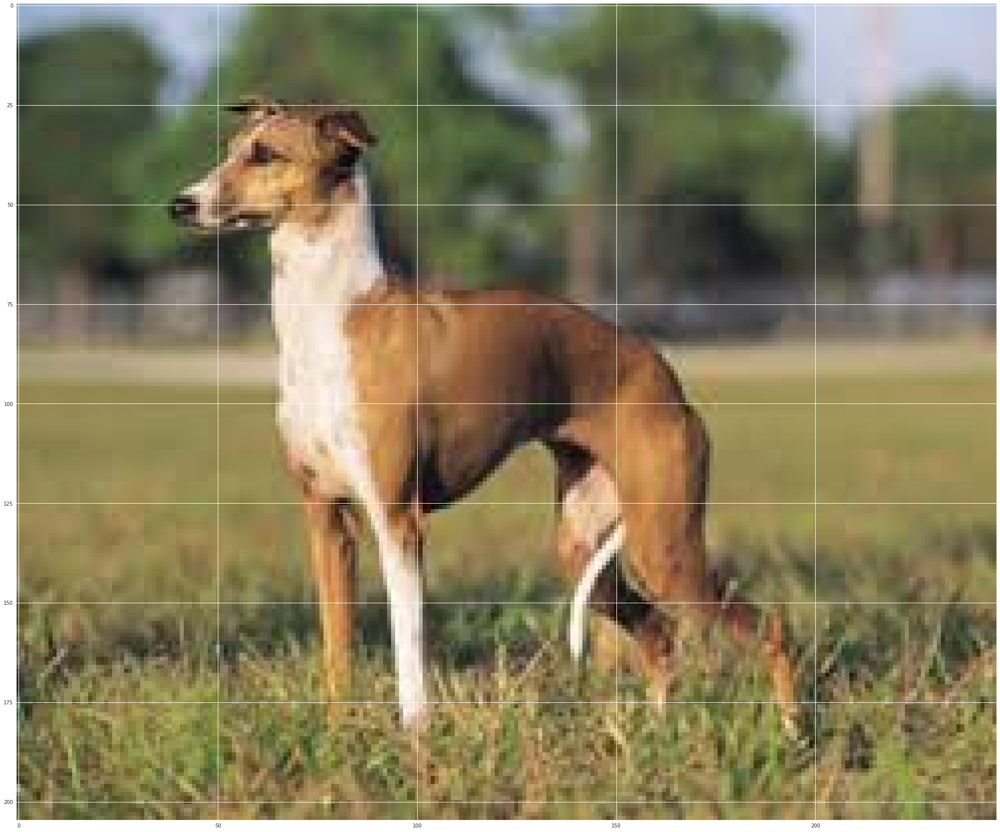

Basenji
actual label:
test_images/Lhasa Apso.jpg
predicted label:


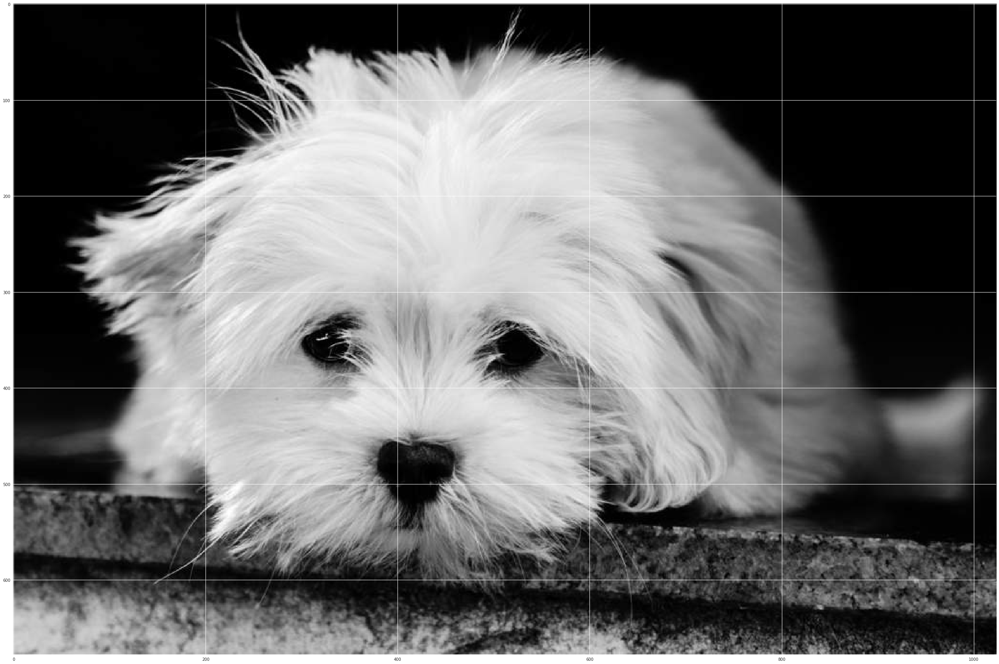

Havanese
actual label:
test_images/afghan hound.png
predicted label:


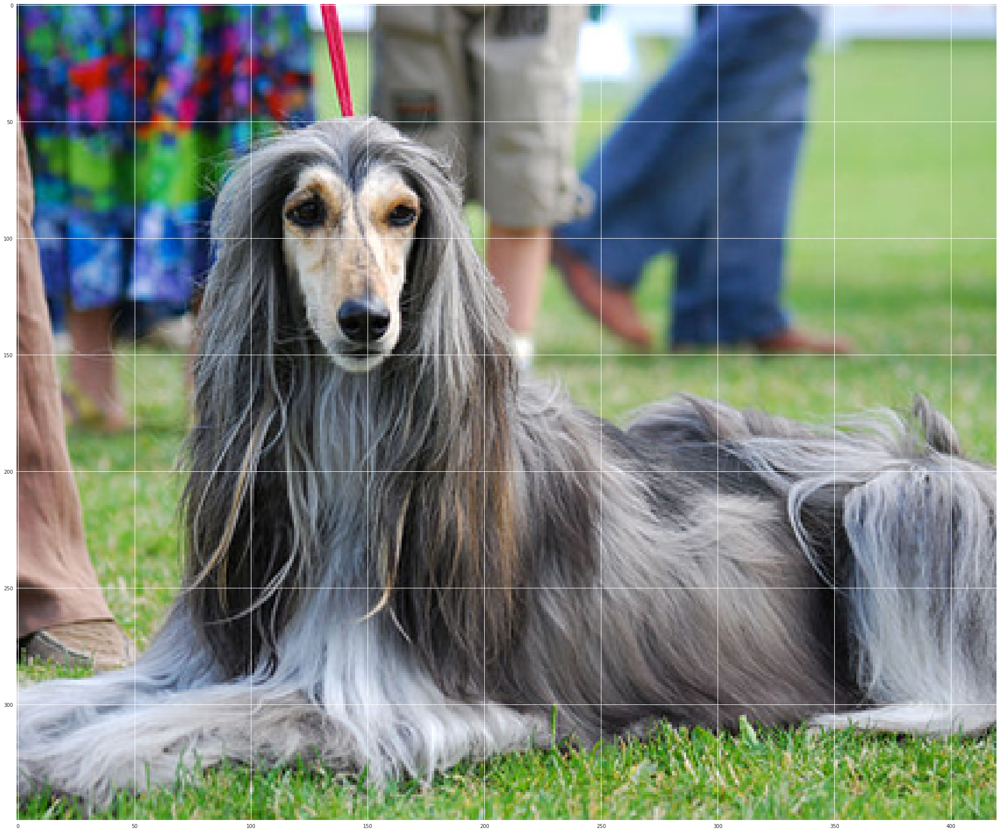

Afghan_hound
actual label:
test_images/Basenji_.jpg
predicted label:


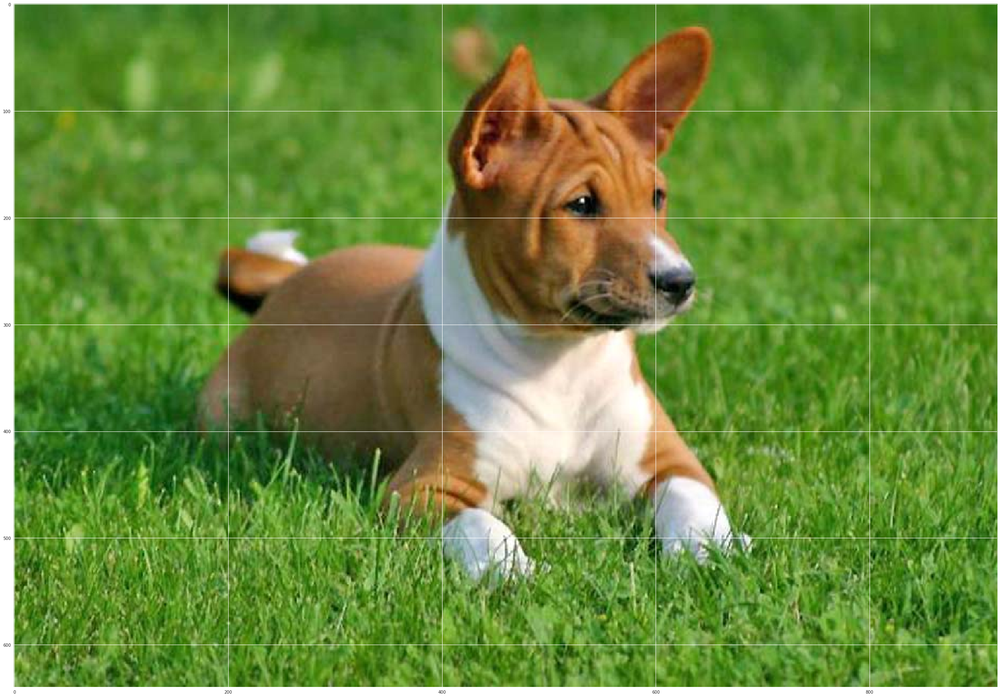

Basenji
actual label:
test_images/german pinscher.jpeg
predicted label:


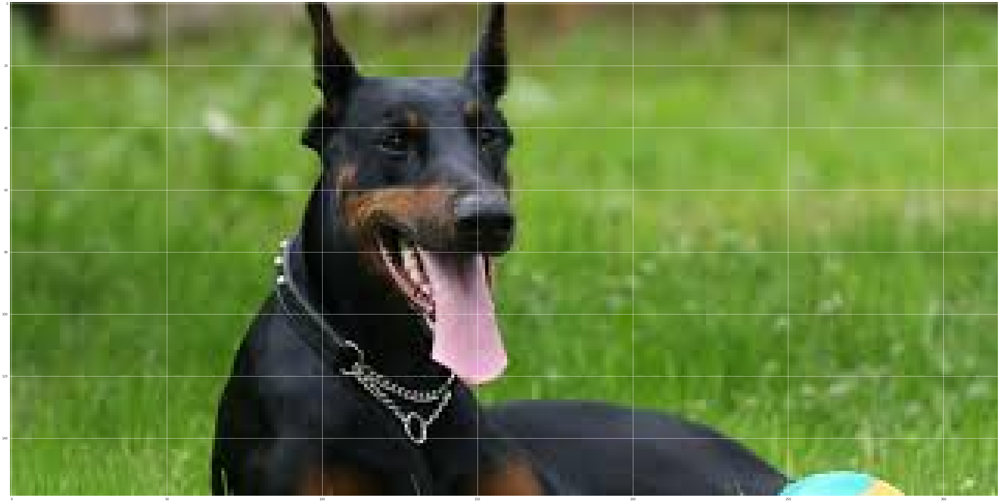

Doberman_pinscher
actual label:
test_images/saint bernard.jpg
predicted label:


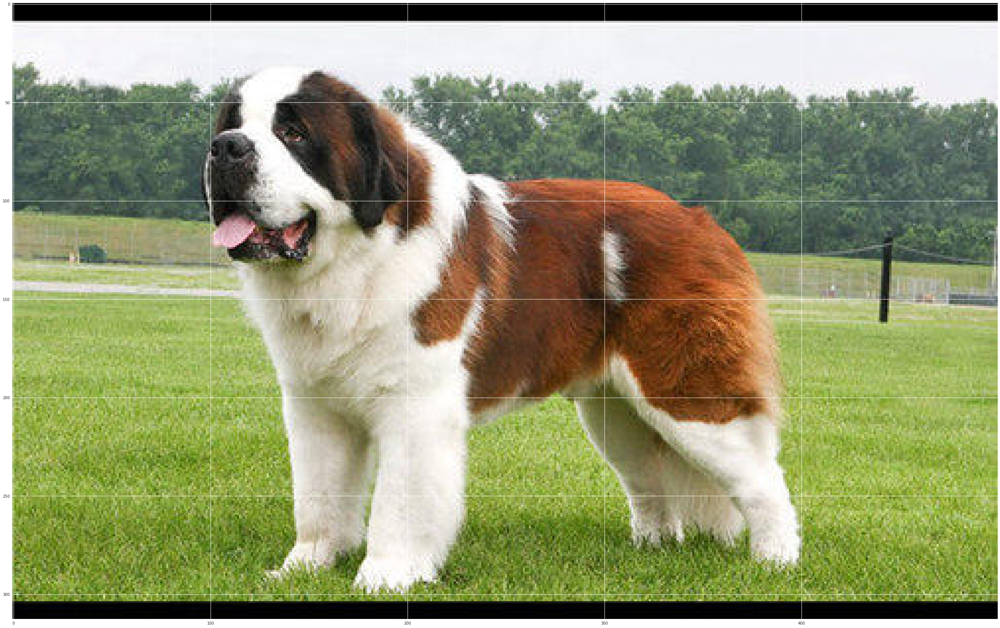

Saint_bernard


In [51]:
for path in test_images_files:
    print("actual label:")
    print(path)
    print("predicted label:")
    result = detector(path)
    print (result)

## 3) INCEPTION V3

In [32]:
bottleneck_features_INCEPTION = np.load('bottleneck_features/DogInceptionV3Data.npz')
train_INCEPTION = bottleneck_features_INCEPTION['train']
valid_INCEPTION = bottleneck_features_INCEPTION['valid']
test_INCEPTION = bottleneck_features_INCEPTION['test']

### USING AS FEATURE EXTRACTOR

In [33]:
INCEPTION_model = Sequential()
INCEPTION_model.add(GlobalAveragePooling2D(input_shape=train_INCEPTION.shape[1:]))
INCEPTION_model.add(Dropout(0.4))
INCEPTION_model.add(Dense(500, activation='relu'))
INCEPTION_model.add(Dropout(0.5))
INCEPTION_model.add(Dense(133, activation='softmax'))

INCEPTION_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_3 ( (None, 2048)              0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 500)               1024500   
_________________________________________________________________
dropout_6 (Dropout)          (None, 500)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 133)               66633     
Total params: 1,091,133
Trainable params: 1,091,133
Non-trainable params: 0
_________________________________________________________________


### COMPILING THE MODEL

In [34]:
INCEPTION_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### CHECKPOINT CREATION

In [36]:
Checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.INCEPTION.hdf5', 
                               verbose=1, save_best_only=True)

INCEPTION_model.fit(train_INCEPTION, train_labels, 
          validation_data=(valid_INCEPTION, valid_labels),
          epochs=20, batch_size=20, callbacks= [Checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 11s 2ms/step - loss: 2.2433 - acc: 0.4957 - val_loss: 0.7078 - val_acc: 0.7820

Epoch 00001: val_loss improved from inf to 0.70778, saving model to saved_models/weights.best.INCEPTION.hdf5
Epoch 2/20
6680/6680 [==============================] - 9s 1ms/step - loss: 1.0870 - acc: 0.7181 - val_loss: 0.7228 - val_acc: 0.8000

Epoch 00002: val_loss did not improve
Epoch 3/20
6680/6680 [==============================] - 9s 1ms/step - loss: 0.9213 - acc: 0.7597 - val_loss: 0.6407 - val_acc: 0.8084

Epoch 00003: val_loss improved from 0.70778 to 0.64067, saving model to saved_models/weights.best.INCEPTION.hdf5
Epoch 4/20
6680/6680 [==============================] - 9s 1ms/step - loss: 0.8634 - acc: 0.7841 - val_loss: 0.6409 - val_acc: 0.8347

Epoch 00004: val_loss did not improve
Epoch 5/20
6680/6680 [==============================] - 9s 1ms/step - loss: 0.8099 - acc: 0.7924 - val_loss: 0.721

### SAVING WEIGHTS

In [37]:
INCEPTION_model.load_weights('saved_models/weights.best.INCEPTION.hdf5')

###  ACCURACY ON TEST SET

In [38]:
INCEPTION_predictions = [np.argmax(INCEPTION_model.predict(np.expand_dims(feature, axis=0))) for feature in test_INCEPTION]

test_accuracy = 100*np.sum(np.array(INCEPTION_predictions)==np.argmax(test_labels, axis=1))/len(INCEPTION_predictions)
print('Test accuracy: %.2f%%' % test_accuracy)

Test accuracy: 78.35%


### TESTING ON IMAGES NOT SEEN BY THE NETWORK

In [39]:
from extract_bottleneck_features import *

def INCEPTION_prediction(img_path):
    bottleneck_feature = extract_InceptionV3(tensor_4d(img_path))
    predicted_vector = INCEPTION_model.predict(bottleneck_feature)
    return dog_names[np.argmax(predicted_vector)]

In [40]:
def detector(img_path):
    breed = INCEPTION_prediction(img_path) 
    
    image = cv2.imread(img_path)
    cv_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(cv_rgb)
    plt.show()
    return breed
    


In [41]:
test_images_files = np.array(glob("test_images/*"))
print(test_images_files)

['test_images/italian greyhound.jpeg' 'test_images/Lhasa Apso.jpg'
 'test_images/afghan hound.png' 'test_images/Basenji_.jpg'
 'test_images/german pinscher.jpeg' 'test_images/saint bernard.jpg']


actual label:
test_images/italian greyhound.jpeg
predicted label:
87916544/87910968 [==============================] - 577s 7us/step


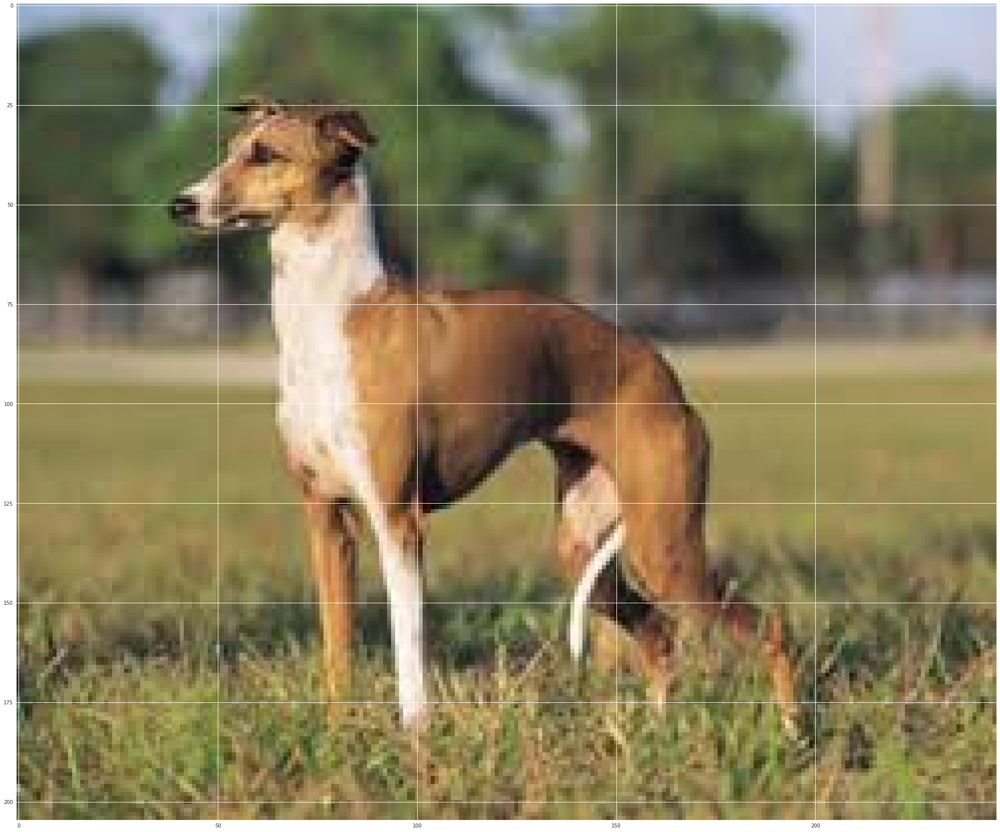

Italian_greyhound
actual label:
test_images/Lhasa Apso.jpg
predicted label:


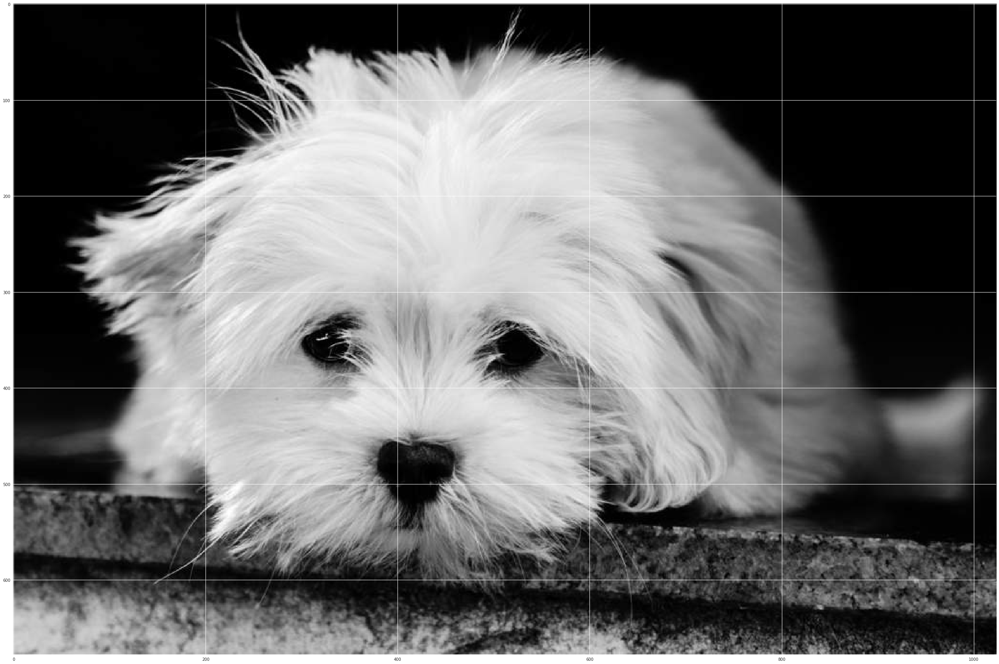

Lowchen
actual label:
test_images/afghan hound.png
predicted label:


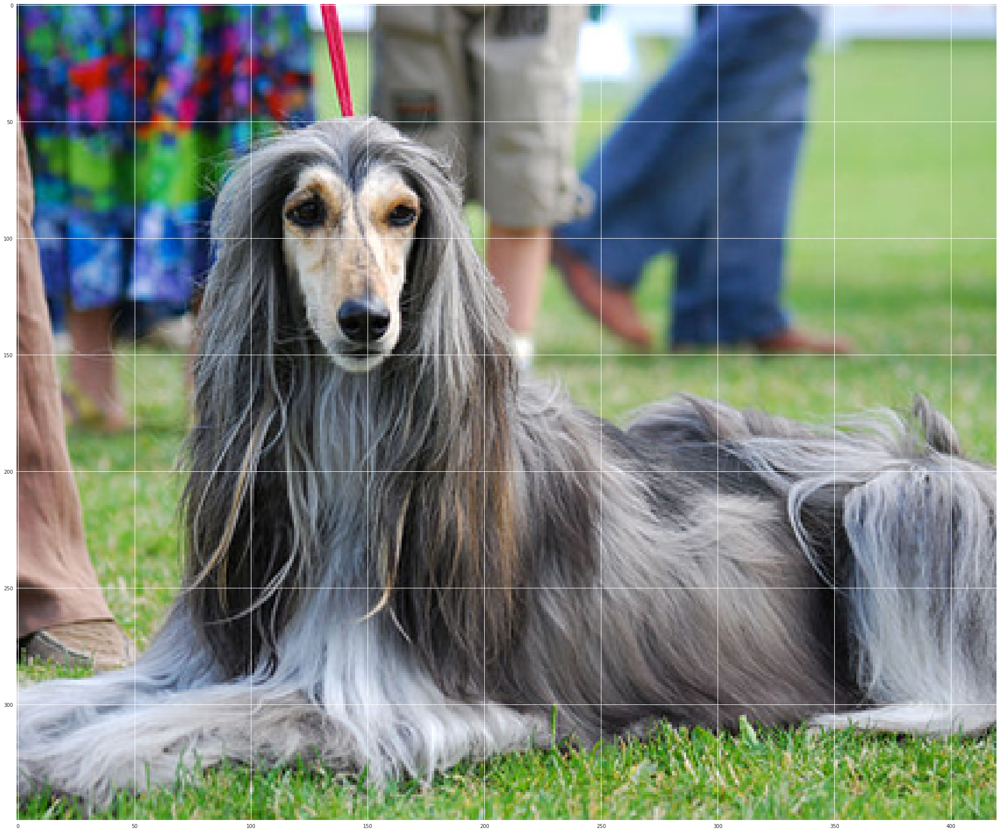

Afghan_hound
actual label:
test_images/Basenji_.jpg
predicted label:


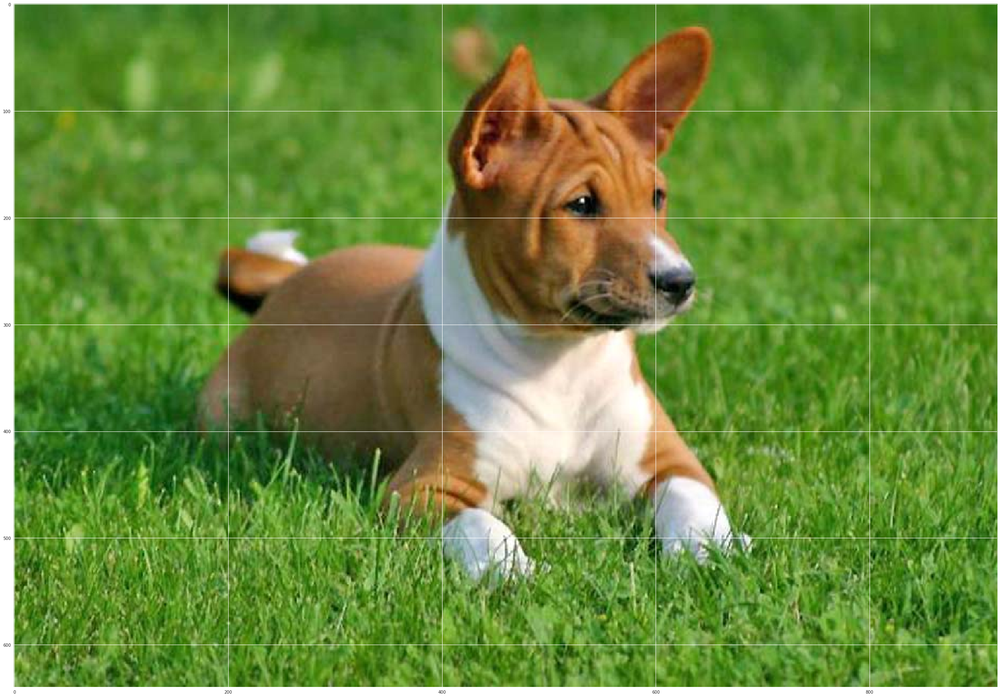

Basenji
actual label:
test_images/german pinscher.jpeg
predicted label:


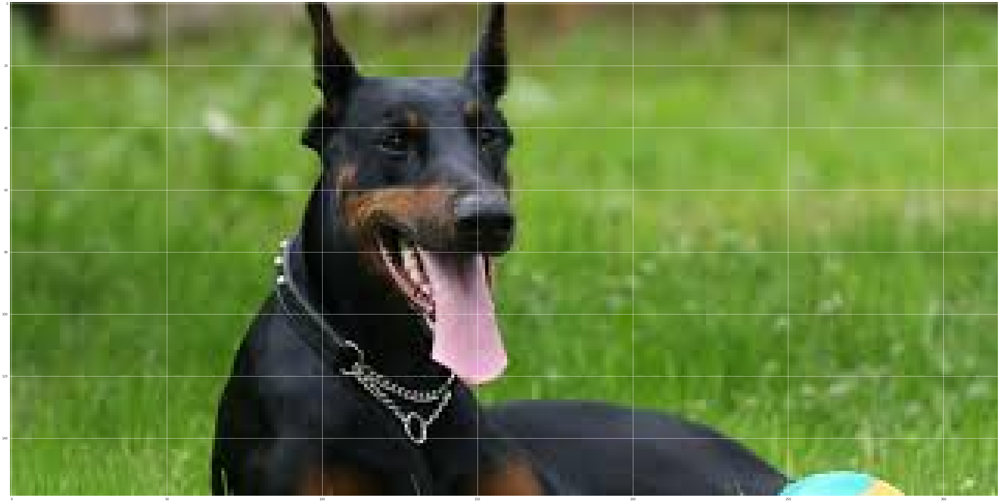

Doberman_pinscher
actual label:
test_images/saint bernard.jpg
predicted label:


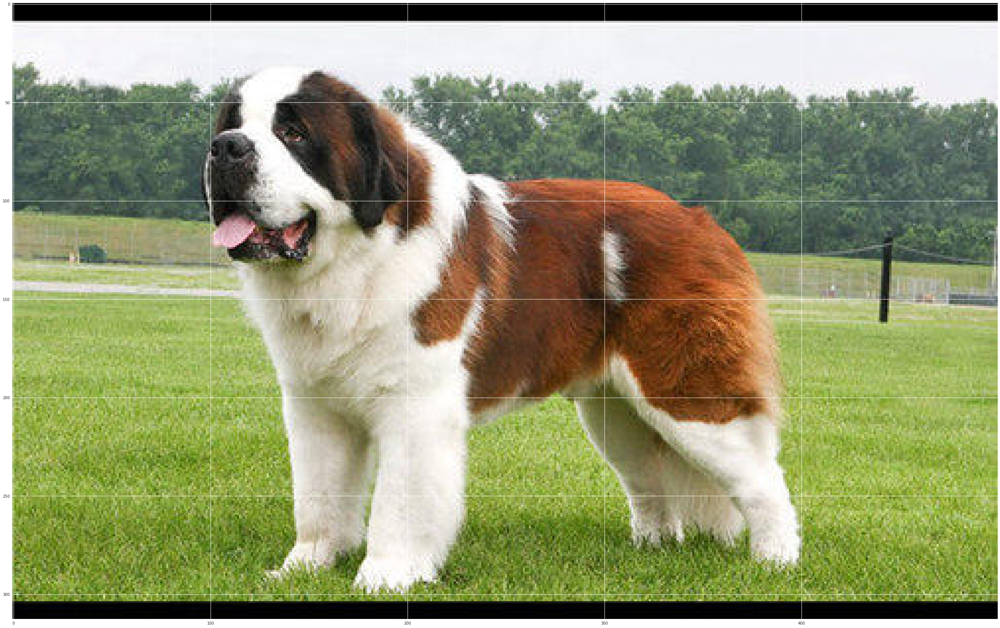

Saint_bernard


In [42]:
for path in test_images_files:
    print("actual label:")
    print(path)
    print("predicted label:")
    result = detector(path)
    print (result)